<a href="https://colab.research.google.com/github/Jucamilocar08/Proyecto_IA/blob/main/PROYECTO_ENTREGA2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importación de datos




In [ ]:
!wget --no-cache -O init.py -q https://raw.githubusercontent.com/rramosp/ai4eng.v1/main/content/init.py
import init; init.init(force_download=False); init.get_weblink()
init.endpoint

'https://m5knaekxo6.execute-api.us-west-2.amazonaws.com/dev-v0001/rlxmooc'

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import gdown
import math
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from local.lib import mlutils
from IPython.display import Image
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import MultinomialNB
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
!gdown https://drive.google.com/uc?id=1YtvXZ5JVFz-R2FG2BkdSUd98T83qLhMg

Downloading...
From: https://drive.google.com/uc?id=1YtvXZ5JVFz-R2FG2BkdSUd98T83qLhMg
To: /content/weatherAUS.csv
100% 14.2M/14.2M [00:00<00:00, 145MB/s]


In [ ]:
# Lectura de DataFrame y Cambio de index
df = pd.read_csv("weatherAUS.csv", sep=";")
df.index = pd.to_datetime(df['Date'], format='%d/%m/%Y') # %H:%M')
df_l=df.copy()
del(df["Date"])

In [ ]:
# sort by Location
df.sort_values(by='Location' , inplace=True)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2010-04-30,Adelaide,10.8,21.2,0.0,1.8,6.6,ENE,22.0,ENE,NW,...,66.0,48.0,1028.4,1024.7,NaN,NaN,15.7,21.0,No,No
2014-07-22,Adelaide,3.7,19.0,0.0,1.4,NaN,N,24.0,NaN,NNE,...,75.0,32.0,1024.2,1021.1,NaN,NaN,9.6,18.5,No,No
2014-07-23,Adelaide,9.6,15.8,0.0,2.6,NaN,NE,52.0,NNE,NE,...,35.0,51.0,1017.9,1011.5,NaN,NaN,14.7,15.4,No,Yes
2014-07-24,Adelaide,10.1,15.5,16.6,0.8,NaN,NNE,50.0,NW,NW,...,96.0,80.0,1007.4,1008.0,NaN,NaN,11.2,14.0,Yes,Yes
2014-07-25,Adelaide,11.2,16.2,1.8,0.6,NaN,NW,30.0,WNW,WNW,...,89.0,70.0,1018.4,1019.2,NaN,NaN,13.0,15.3,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-01-14,Woomera,16.8,31.9,0.0,27.0,NaN,SSE,44.0,SE,S,...,51.0,17.0,1017.3,1014.2,0.0,NaN,20.2,29.5,No,No
2012-01-15,Woomera,17.0,33.5,0.0,12.4,12.7,SSE,43.0,ESE,ESE,...,38.0,12.0,1015.2,1011.8,0.0,0.0,22.2,32.0,No,No
2012-01-16,Woomera,18.9,38.8,0.0,12.0,12.4,N,41.0,ENE,NNW,...,10.0,5.0,1012.0,1008.7,0.0,0.0,27.6,37.9,No,No


#Visualizacion de datos y relleno de datos faltantes

In [ ]:
# Informacion del dataset antes de iniciar, con el relleno de datos faltantes
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Location,145460,49,Canberra,3436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinTemp,143975.0,NaN,NaN,NaN,12.194034,6.398495,-8.5,7.6,12.0,16.9,33.9
MaxTemp,144199.0,NaN,NaN,NaN,23.221348,7.119049,-4.8,17.9,22.6,28.2,48.1
Rainfall,142199.0,NaN,NaN,NaN,2.360918,8.47806,0.0,0.0,0.0,0.8,371.0
Evaporation,82670.0,NaN,NaN,NaN,5.468232,4.193704,0.0,2.6,4.8,7.4,145.0
Sunshine,75625.0,NaN,NaN,NaN,7.611178,3.785483,0.0,4.8,8.4,10.6,14.5
WindGustDir,135134,16,W,9915,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindGustSpeed,135197.0,NaN,NaN,NaN,40.03523,13.607062,6.0,31.0,39.0,48.0,135.0
WindDir9am,134894,16,N,11758,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindDir3pm,141232,16,SE,10838,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.shape

(145460, 22)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145460 entries, 2010-04-30 to 2017-01-10
Data columns (total 22 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        143975 non-null  float64
 2   MaxTemp        144199 non-null  float64
 3   Rainfall       142199 non-null  float64
 4   Evaporation    82670 non-null   float64
 5   Sunshine       75625 non-null   float64
 6   WindGustDir    135134 non-null  object 
 7   WindGustSpeed  135197 non-null  float64
 8   WindDir9am     134894 non-null  object 
 9   WindDir3pm     141232 non-null  object 
 10  WindSpeed9am   143693 non-null  float64
 11  WindSpeed3pm   142398 non-null  float64
 12  Humidity9am    142806 non-null  float64
 13  Humidity3pm    140953 non-null  float64
 14  Pressure9am    130395 non-null  float64
 15  Pressure3pm    130432 non-null  float64
 16  Cloud9am       89572 non-null   float64
 17  Cloud3pm     

In [ ]:
## Mirar los valores no nulos y el tipo
k = df.isna().sum()
k[k!=0]

MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [ ]:
# Reemplaza las columnas especificadas con valores sin NaN
columns_to_clean = ["Evaporation", "Sunshine", "Pressure9am", "Pressure3pm", "Cloud9am", "Cloud3pm","RainTomorrow","RainToday"]

# Elimina filas con valores NaN en las columnas seleccionadas
df = df.dropna(subset=columns_to_clean)

# Ahora df_cleaned no contendrá filas con valores NaN en las columnas especificadas
k = df.isna().sum()
print(k[k!=0])
print("Shape: ",df.shape)

MinTemp            41
MaxTemp            22
WindGustDir      3849
WindGustSpeed    3832
WindDir9am       1833
WindDir3pm        315
WindSpeed9am      103
WindSpeed3pm       75
Humidity9am       144
Humidity3pm        84
Temp9am            70
Temp3pm            20
dtype: int64
Shape:  (62167, 22)


In [ ]:
# Eliminar todas la filas de que contengan almenos un dato faltante
#Se eliminan 5747 filas adicionales para evitar ingresar ruido al modelo, y se considera prudente debido a la cantidad de datos que se tienen de calidad
df = df.dropna()
df.shape

(56420, 22)

# Cambiar las direccione del aire a numeros igual que Raintoday y tomorrow

In [ ]:
# Paso de Columnas caltegoricas a Columas con datos numericos
diccionario = {
    'NW': '1',
    'ENE': '2',
    'SSE': '3',
    'SE': '4',
    'E': '5',
    'S': '6',
    'N': '7',
    'WNW': '8',
    'ESE': '9',
    'NE': '10',
    'NNE': '11',
    'NNW': '12',
    'SW': '13',
    'W': '14',
    'WSW': '15',
    'SSW': '16'
}


# Aplicar del diccionario a las tres columnas WindGustDir, WindDir9am y WindDir3am

df['WindGustDir'] = df[ 'WindDir3pm'].replace(diccionario)
df[ 'WindDir9am'] = df[ 'WindDir9am'].replace(diccionario)
df[ 'WindDir3pm'] = df[ 'WindDir3pm'].replace(diccionario)

# Categorizacion de las Columnas RainToday y RainTomorrow

df['RainToday']=df['RainToday'].replace(['No'] , '0')
df['RainToday']=df['RainToday'].replace(['Yes'] , '1')
df['RainTomorrow']=df['RainTomorrow'].replace(['No'] , '0')
df['RainTomorrow']=df['RainTomorrow'].replace(['Yes'] , '1')

df = df.apply(pd.to_numeric, errors='ignore')

In [ ]:
# Informacion del dataset despues de rellenar los datos faltantes
df.describe(include='all').T

In [ ]:
df

#Visualizacion grafica de los datos


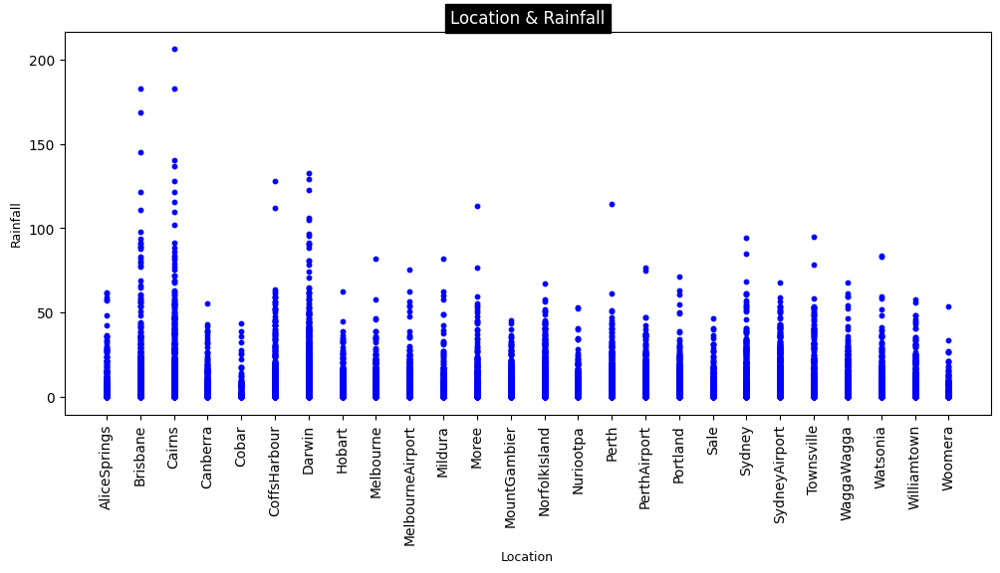

In [ ]:
plt.figure(figsize=(12,5) , dpi=100) # size

plt.scatter(df['Location'] , df['Rainfall'] , color='blue' , marker='o' , s=10)    #coler , marker , s

plt.title('Location & Rainfall' , backgroundcolor='black' , color='white' , fontsize=12) #title
plt.xlabel('Location' , fontsize =9)
plt.ylabel('Rainfall' , fontsize =9)

plt.xticks(rotation=90)

plt.show()

In [ ]:
df1 = df.drop(['Location'], axis=1)
df1
#Dataframe para primeros analisis

<Figure size 2000x2000 with 0 Axes>

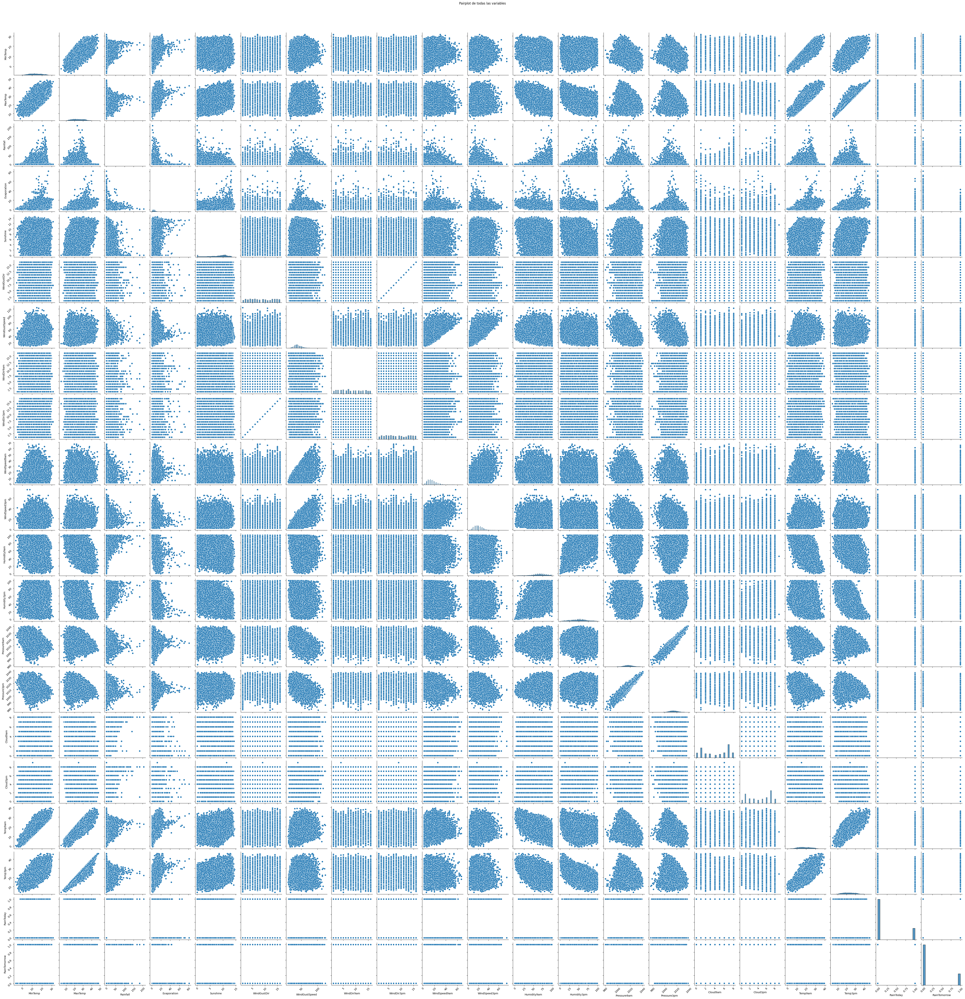

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Ajusta el tamaño de la figura
plt.figure(figsize=(20, 20))

# Crea un pairplot con todas las variables
sns.pairplot(df1)

# Ajusta la posición del título principal para evitar superposición
plt.suptitle('Pairplot de todas las variables', y=1.02)

# Rotación de etiquetas en los ejes
for ax in plt.gcf().axes:
    plt.sca(ax)
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)

# Muestra el gráfico
plt.show()


<Axes: >

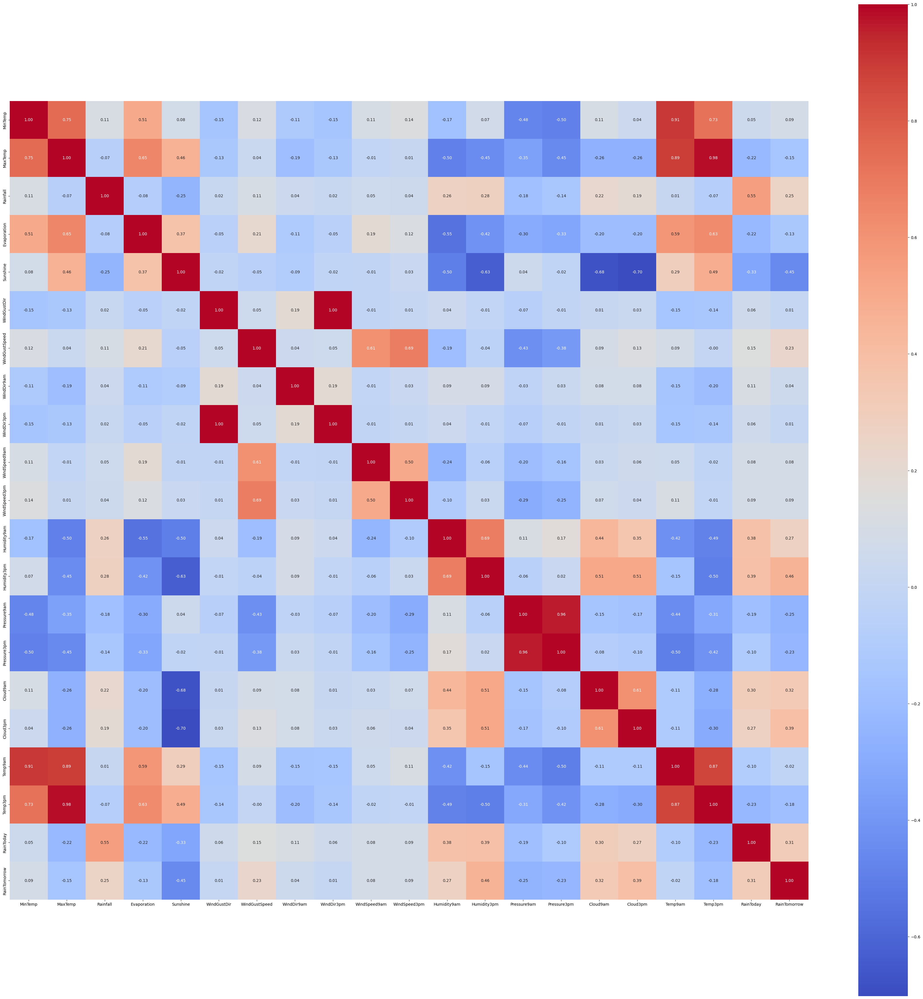

In [ ]:
import seaborn as sns
#Matriz de correlación con todas las de la ley
## KEEPOUTPUT
#correlation matrix
corrmat = df1.corr()
f, ax = plt.subplots(figsize=(45,45))
sns.heatmap(corrmat, vmax=1, square=True, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)

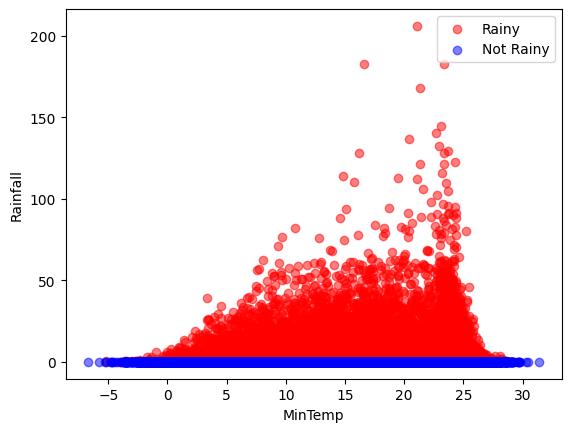

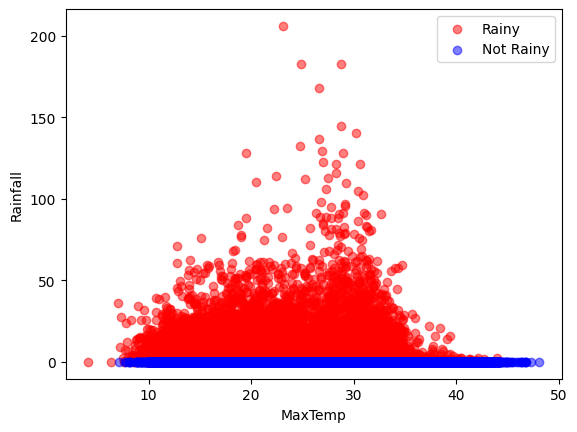

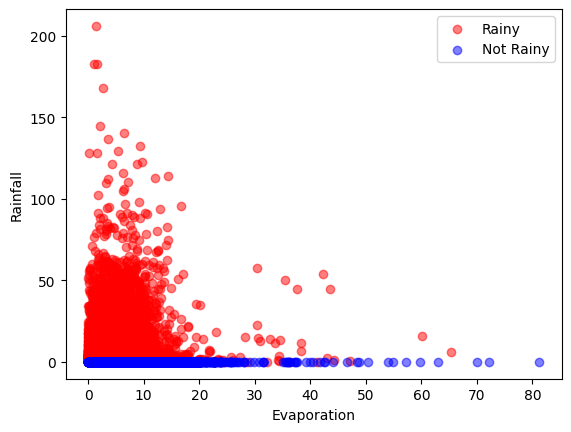

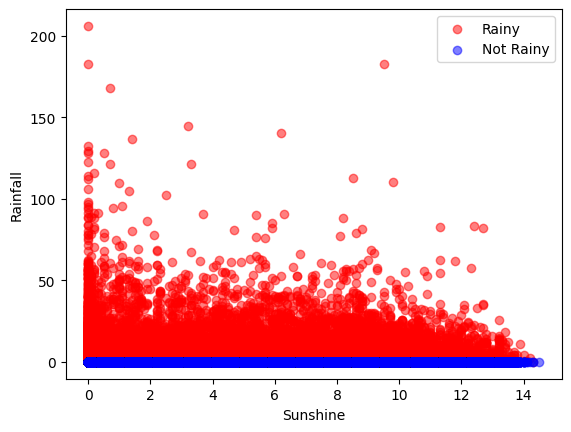

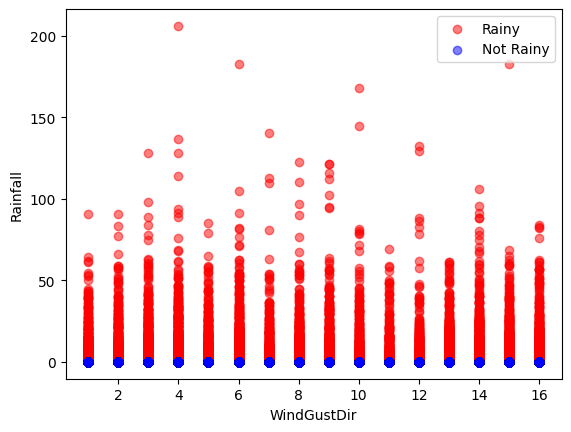

...

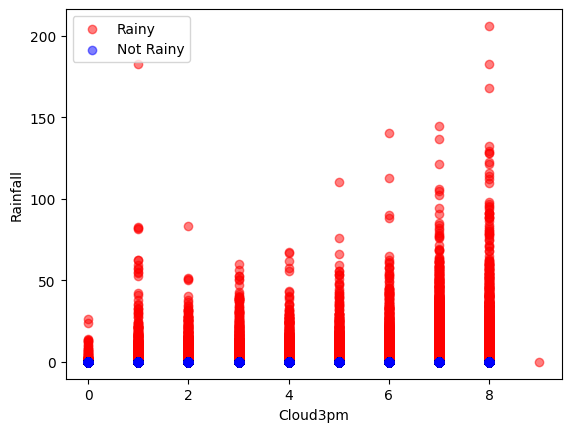

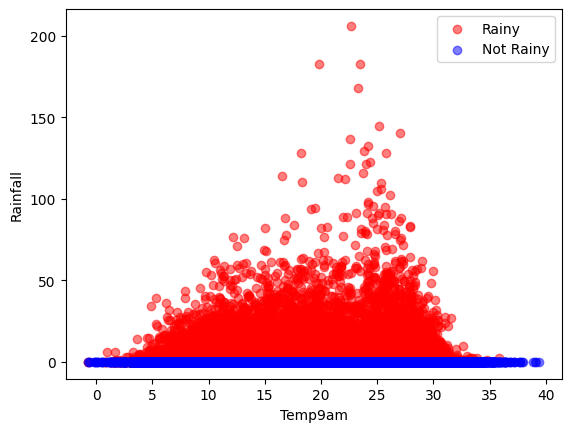

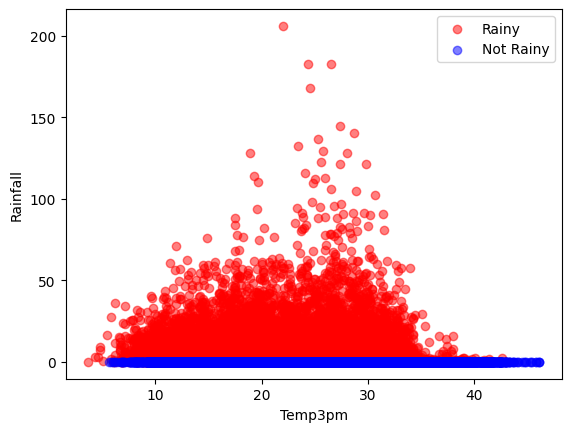

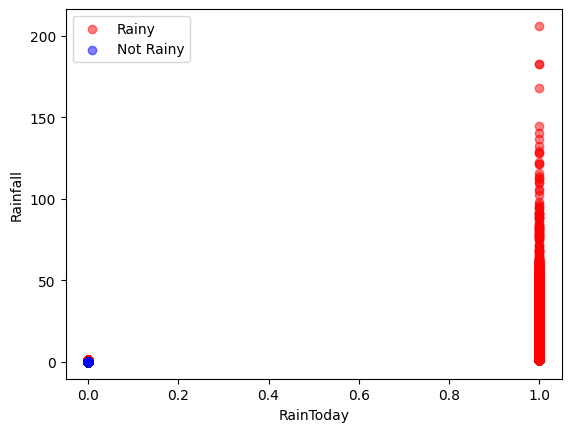

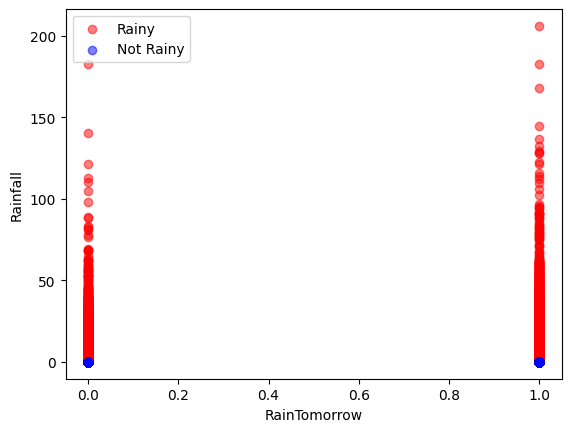

In [ ]:
import matplotlib.pyplot as plt
# Divide los datos en dos grupos según los valores de la variable de respuesta 'RainTomorrow'
rainy = df1[df1['Rainfall'] > 0]
not_rainy = df1[df1['Rainfall'] == 0]

# Graficar cada variable del DataFrame con distinción entre días de lluvia y días sin lluvia
for column in df1.columns:
    if column == 'Rainfall':
        continue  # No graficar la variable "Rainfall" vs. sí misma

    plt.figure()
    plt.scatter(rainy[column], rainy['Rainfall'], label='Rainy', c='r',alpha=0.5)
    plt.scatter(not_rainy[column], not_rainy['Rainfall'], label='Not Rainy', c='b',alpha=0.5)
    plt.xlabel(column)
    plt.ylabel('Rainfall')
    plt.legend()
    plt.show()


# One_hot

In [ ]:
# Aplicacion metodo One-Hot para la categorizacion de las columnas
object_cols = df.select_dtypes(include=['object']).columns

df = pd.get_dummies(df, columns=object_cols)

In [ ]:
df.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Location_AliceSprings',
       'Location_Brisbane', 'Location_Cairns', 'Location_Canberra',
       'Location_Cobar', 'Location_CoffsHarbour', 'Location_Darwin',
       'Location_Hobart', 'Location_Melbourne', 'Location_MelbourneAirport',
       'Location_Mildura', 'Location_Moree', 'Location_MountGambier',
       'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_Perth',
       'Location_PerthAirport', 'Location_Portland', 'Location_Sale',
       'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville',
       'Location_WaggaWagga', 'Location_Watsonia', 'Location_Williamtown',
       'Location_Woomera'],
      dtype='object')

In [ ]:
# Organizar la información en el orden we want to see
cols = [col for col in df if col not in ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow',]] + ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow',]
df = df[cols]
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 56420 entries, 2015-09-13 to 2012-01-18
Data columns (total 47 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Location_AliceSprings      56420 non-null  uint8  
 1   Location_Brisbane          56420 non-null  uint8  
 2   Location_Cairns            56420 non-null  uint8  
 3   Location_Canberra          56420 non-null  uint8  
 4   Location_Cobar             56420 non-null  uint8  
 5   Location_CoffsHarbour      56420 non-null  uint8  
 6   Location_Darwin            56420 non-null  uint8  
 7   Location_Hobart            56420 non-null  uint8  
 8   Location_Melbourne         56420 non-null  uint8  
 9   Location_MelbourneAirport  56420 non-null  uint8  
 10  Location_Mildura           56420 non-null  uint8  
 11  Location_Moree             56420 non-null  uint8  
 12  Location_MountGambier      56420 non-null  uint8  
 13  Location_NorfolkIsland     56

# Modelo de predicción

In [ ]:
#DataFrame 'df' con las características y 'y' con las etiquetas
x = df.drop(['RainTomorrow'], axis=1)
y = y.ravel()

def Logreg(x, y, test_sizes,z):
    # Crea un DataFrame vacío para almacenar los resultados
    df_results = pd.DataFrame()

    for test_size in test_sizes:
        # Divide los datos en conjuntos de entrenamiento y prueba
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size, random_state=0)

        # Crea un modelo de regresión logística con el solver 'sag'
        logreg = LogisticRegression(solver=z,random_state=1 , verbose=1 ,n_jobs=-1)

        # Entrena el modelo en el conjunto de entrenamiento
        logreg.fit(x_train, y_train)

        # Realiza predicciones en el conjunto de prueba
        y_pred = logreg.predict(x_test)

        # Calcula la precisión del modelo en el conjunto de prueba
        accuracy = metrics.accuracy_score(y_test, y_pred)

        # Calcula la puntuación del modelo en el conjunto completo (solo para referencia)
        score = logreg.score(x, y)

        # Almacena los resultados en el DataFrame
        data_dict = {'Test_size': test_size, 'Accuracy': accuracy, 'Score': score}
        df_results = df_results.append(data_dict, ignore_index=True)

    return df_results

In [ ]:
# Llama a la función y especifica los tamaños de prueba que deseas evaluar
test_sizes = [0.1, 0.15, 0.2, 0.25, 0.3]
z="newton-cg"
df_e = Logreg(x, y, test_sizes,z)

# Imprime los resultados
df_e

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


,Test_size,Accuracy,Score
0,0.10,0.853952,0.856292
1,0.15,0.854780,0.856274
2,0.20,0.855636,0.856292
3,0.25,0.856505,0.856062
4,0.30,0.856493,0.856044


In [ ]:
# Llama a la función y especifica los tamaños de prueba que deseas evaluar
test_sizes = [0.1, 0.15, 0.2, 0.25, 0.3]
z="sag"
df_e = Logreg(x, y, test_sizes,z)

# Imprime los resultados
df_e

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 3 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 2 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 2 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 3 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 3 seconds


,Test_size,Accuracy,Score
0,0.10,0.851471,0.852783
1,0.15,0.852771,0.852659
2,0.20,0.853332,0.852517
3,0.25,0.854094,0.852535
4,0.30,0.853421,0.852552


In [ ]:
# Llama a la función y especifica los tamaños de prueba que deseas evaluar
test_sizes = [0.1, 0.15, 0.2, 0.25, 0.3]
z="liblinear"
df_e = Logreg(x, y, test_sizes,z)

# Imprime los resultados
df_e

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]

,Test_size,Accuracy,Score
0,0.10,0.852003,0.855246
1,0.15,0.851826,0.855069
2,0.20,0.853244,0.855087
3,0.25,0.854874,0.855122
4,0.30,0.855075,0.855317


In [ ]:
# Llama a la función y especifica los tamaños de prueba que deseas evaluar
test_sizes = [0.1, 0.15, 0.2, 0.25, 0.3]
z="saga"
df_e = Logreg(x, y, test_sizes,z)

# Imprime los resultados
df_e

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 5 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 4 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 4 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 4 seconds


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.


max_iter reached after 3 seconds


,Test_size,Accuracy,Score
0,0.10,0.850939,0.852304
1,0.15,0.852535,0.852162
2,0.20,0.853775,0.852340
3,0.25,0.853598,0.851879
4,0.30,0.853539,0.852109


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


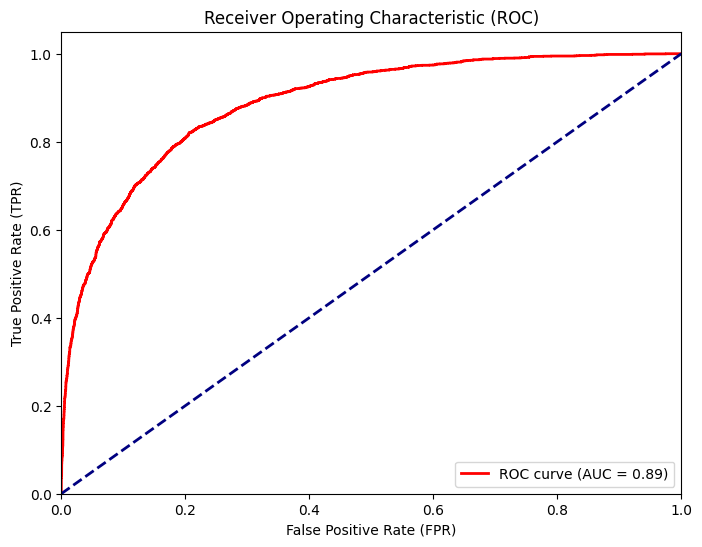

In [ ]:
from sklearn.metrics import roc_auc_score, auc

# Calcula las probabilidades de predicción y las tasas de FPR y TPR
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

# Crea un modelo de regresión logística con el solver 'sag'
logreg = LogisticRegression(solver="newton-cg",random_state=1 , verbose=1 ,n_jobs=-1)

# Entrena el modelo en el conjunto de entrenamiento
logreg.fit(x_train, y_train)

y_pred_proba = logreg.predict_proba(x_test)[::, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)

# Calcula el AUC-ROC
roc_auc = auc(fpr, tpr)

# Grafica la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

tpr: 0.5426893055443792
fpr: 0.0551224058372923


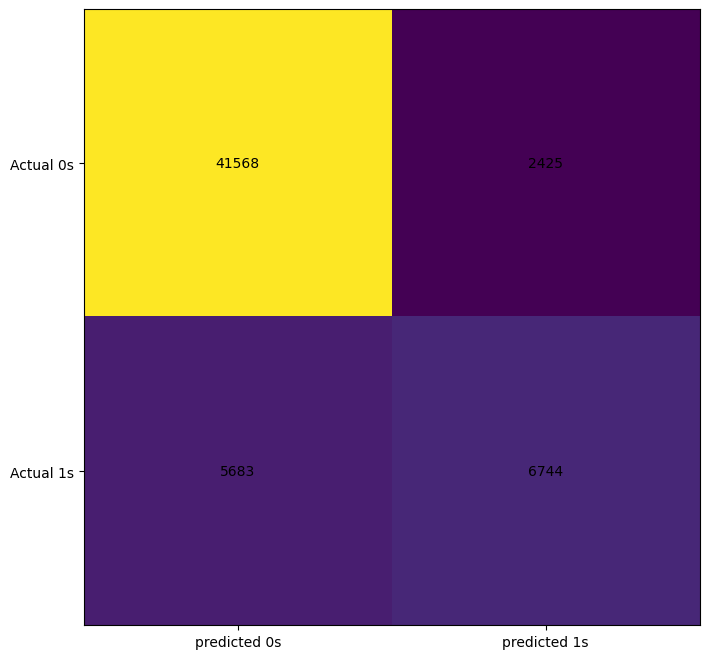

In [ ]:
cm = confusion_matrix(y , logreg.predict(x))
fig , ax = plt.subplots(figsize=(8,8))
tn, fp, fn, tp = cm.ravel()
tpr = tp / (tp + fn)
fpr = fp / (fp + tn)
print("tpr:", tpr)
print("fpr:", fpr)
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0,1) , ticklabels=('predicted 0s' , 'predicted 1s'))
ax.yaxis.set(ticks=(0,1) , ticklabels=('Actual 0s' , 'Actual 1s'))
ax.set_ylim(1.5 , -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j ,i , cm[i,j] , ha='center' , va='center' , color='black')

plt.show()



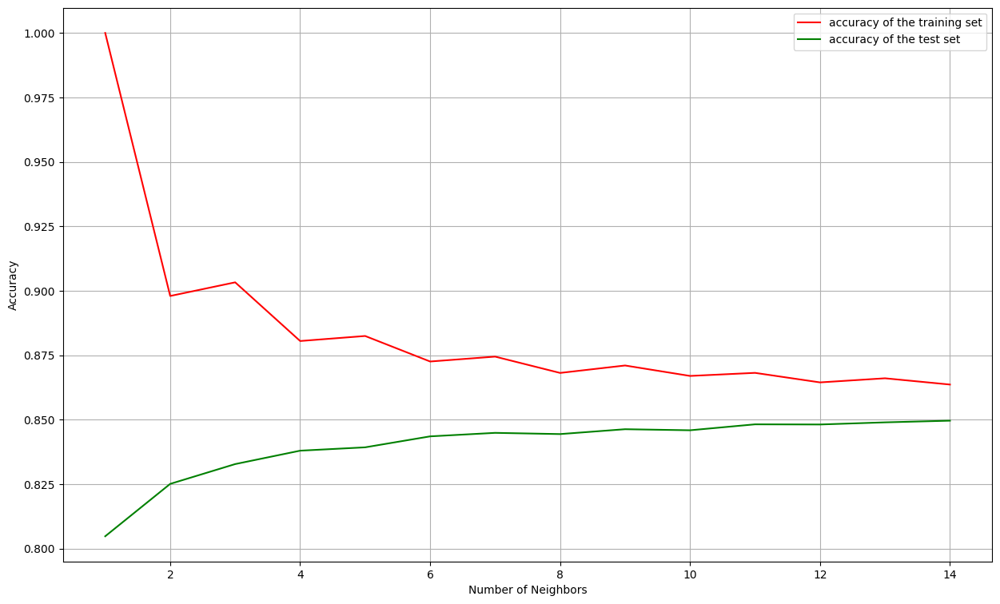

In [ ]:
training_acc = []
test_acc = []
# try knn for diffrent k nearst neighbor from 1 to 25
neighbors_setting = range(1 , 15)
for n_neighbors in neighbors_setting:
    Knn_model = KNeighborsClassifier(n_neighbors = n_neighbors)
    Knn_model.fit(x_train , y_train.ravel())
    training_acc.append(Knn_model.score(x_train , y_train))
    test_acc.append(Knn_model.score(x_test , y_test))


plt.figure(figsize=(15 , 9))
plt.plot(neighbors_setting , training_acc , label='accuracy of the training set' , color='red')
plt.plot(neighbors_setting , test_acc , label='accuracy of the test set' , color='green')
plt.ylabel('Accuracy')
plt.xlabel('Number of Neighbors')
plt.legend()
plt.grid()
